# Minute Weather Data Analysis & Prediction

## Importing Libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
filterwarnings('ignore')

## Importing Data

In [90]:
path = 'data/minute_weather.csv'
df = pd.read_csv(path)
df.dataframeName = 'minute_weather'
nRow, nCol = df.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 1587257 rows and 13 columns


## Performing EDA

In [92]:
df.head()

,rowID,hpwren_timestamp,air_pressure,air_temp,avg_wind_direction,avg_wind_speed,max_wind_direction,max_wind_speed,min_wind_direction,min_wind_speed,rain_accumulation,rain_duration,relative_humidity
0,0,2011-09-10 00:00:49,912.3,64.76,97.0,1.2,106.0,1.6,85.0,1.0,NaN,NaN,60.5
1,1,2011-09-10 00:01:49,912.3,63.86,161.0,0.8,215.0,1.5,43.0,0.2,0.0,0.0,39.9
2,2,2011-09-10 00:02:49,912.3,64.22,77.0,0.7,143.0,1.2,324.0,0.3,0.0,0.0,43.0
3,3,2011-09-10 00:03:49,912.3,64.40,89.0,1.2,112.0,1.6,12.0,0.7,0.0,0.0,49.5
4,4,2011-09-10 00:04:49,912.3,64.40,185.0,0.4,260.0,1.0,100.0,0.1,0.0,0.0,58.8


### Insights On Data Set :

1. rowID: unique number for each row (Unit: NA)
2. hpwren_timestamp: timestamp of measure (Unit: year-month-day hour:minute:second)
3. air_pressure: air pressure measured at the timestamp (Unit: hectopascals)
4. air_temp: air temperature measure at the timestamp (Unit: degrees Fahrenheit)
5. avg_wind_direction: wind direction averaged over the minute before the timestamp (Unit: degrees, with 0 means coming from the North, and increasing clockwise)
6. avg_wind_speed: wind speed averaged over the minute before the timestamp (Unit: meters per second)
7. max_wind_direction: highest wind direction in the minute before the timestamp (Unit: degrees, with 0 being North and increasing clockwise)
8. max_wind_speed: highest wind speed in the minute before the timestamp (Unit: meters per second)
9. min_wind_direction: smallest wind direction in the minute before the timestamp (Unit: degrees, with 0 being North and inceasing clockwise)
10. min_wind_speed: smallest wind speed in the minute before the timestamp (Unit: meters per second)
11. rain_accumulation: amount of accumulated rain measured at the timestamp (Unit: millimeters)
12. rain_duration: length of time rain has fallen as measured at the timestamp (Unit: seconds)
13. relative_humidity: relative humidity measured at the timestamp (Unit: percent)

### Required Features :

For our data analysis we will be using the following features:

    air_pressure
    air_temp
    avg_wind_direction
    avg_wind_speed
    max_wind_direction
    max_wind_speed
    min_wind_direction
    min_wind_speed
    rain_accumulation
    rain_duration
    relative_humidity
    
we don't need to use the rowID, hpwren_timestamp

By clustering the data we can predict Air Temperature or Relative Humidity.

## Feature Selection

In [93]:
# Reuiqred Features
features = ["air_pressure",
            "air_temp",
            "avg_wind_direction",
            "avg_wind_speed",
            "max_wind_direction",
            "max_wind_speed",
            "min_wind_direction",
            "min_wind_speed",
            "rain_accumulation",
            "rain_duration",
            "relative_humidity"]

# Selecting Features only
df = df[features]

## Checking for Missing Values

In [94]:
# Checking if any NaN values are present
df.isnull().sum()

air_pressure            0
air_temp                0
avg_wind_direction    433
avg_wind_speed        433
max_wind_direction    433
max_wind_speed        433
min_wind_direction    433
min_wind_speed        433
rain_accumulation       1
rain_duration           1
relative_humidity       0
dtype: int64

We've 1587257 datapoints out of which we have very less number of missing values.
So, we can safely drop the missing values & perform our analysis 'cause it won't affect our results.

In [95]:
# Dropping data points having NaN values
df = df.dropna()

## Profile Report Generation

In [8]:
import pandas_profiling
pandas_profiling.ProfileReport(df)

Render HTML: 100%|██████████| 1/1 [00:10<00:00, 10.16s/it]


In [9]:
## Saving Profile Report as an external File
profile = pandas_profiling.ProfileReport(df)
profile.to_file(r"outputs/Profile_Report.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00,  8.81it/s]


## Goal : 
1. Predict Air Temperature
2. Predict Relative Humidity

In [7]:
# Creating two separate dataframes for Air Temperature Prediction and Relative HUmidity Prediction
df_temp = df.copy()
df_humidity = df.copy()

## Analysis & Data Preparation for Air Temperature Prediction

In [29]:
avg_temp = df['air_temp'].mean()
max_temp = df['air_temp'].max()
min_temp = df['air_temp'].min()
print(f"The average temperature is {round(avg_temp)}"
      f"\nThe maximum temperature is {max_temp}"
      f"\nThe minimum temperature is {min_temp}")

The average temperature is 62
The maximum temperature is 99.5
The minimum temperature is 31.64


### Correlation

In [40]:
## Finding Correlation between features
corr = df_temp.corrwith(df_temp['air_temp'])

In [41]:
print(f"Correlation : \n{corr}")

Correlation : 
air_pressure          0.021001
air_temp              1.000000
avg_wind_direction   -0.019254
avg_wind_speed       -0.203787
max_wind_direction   -0.044313
max_wind_speed       -0.205920
min_wind_direction    0.027289
min_wind_speed       -0.193223
rain_accumulation    -0.000320
rain_duration        -0.004295
relative_humidity    -0.520171
dtype: float64


We can see there's no high correlation between the features and the target variable(air temperature).

For Classification we will be classifying air temperature in two classes :
1. Relatively Cool
2. Relatively Hot

### Data Encoding

In [30]:
mean = df['air_temp'].mean()

def encoder(data):
    if data <= mean:
        return 0
    elif data > mean:
        return 1

df_temp['air_temp'] = df_temp['air_temp'].apply(encoder)
print(df_temp["air_temp"].unique())

[1 0]


### Let's see the distribution of two classes w.r.t each features

As we've seen, there's a huge number of datapoints .So, to plot distribution I'm going to use 5000 datapoints only otherwise it'll take more computation power & time.

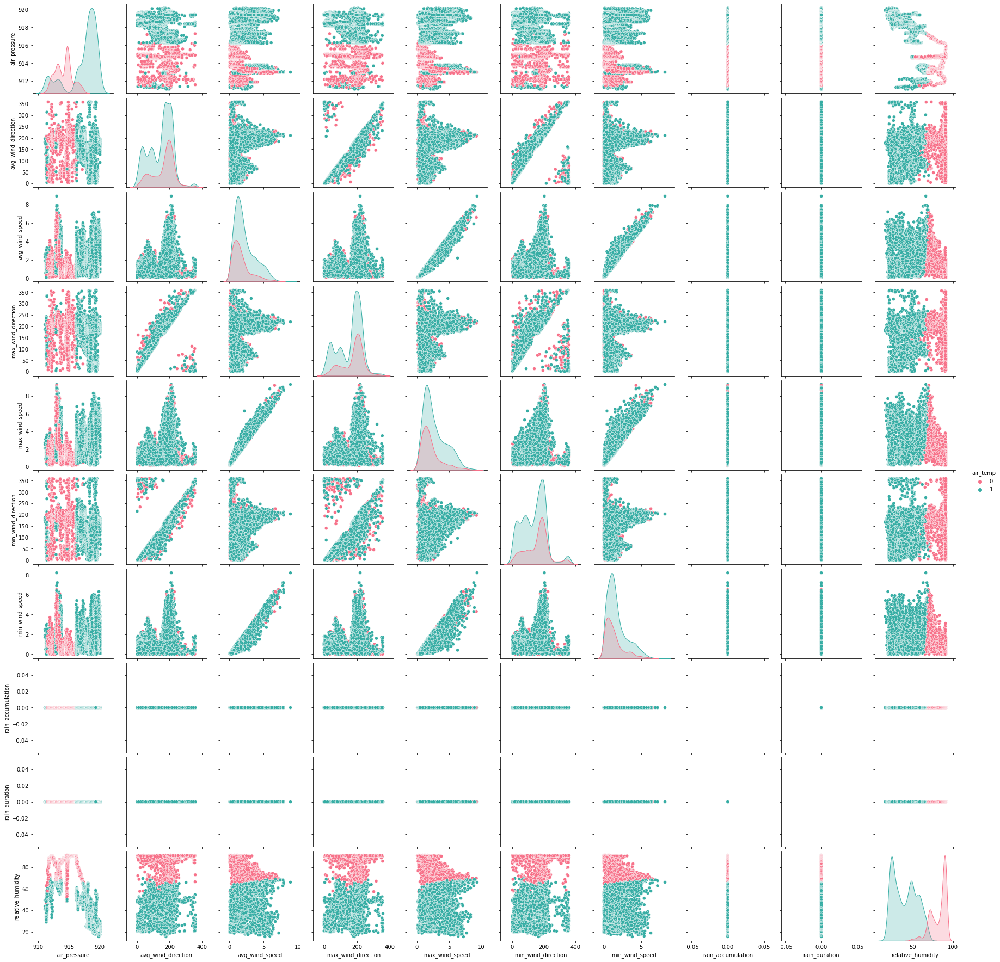

In [14]:
sns.pairplot(df_temp.iloc[:5000, :], hue="air_temp", palette="husl")

### Data-Preparation :

In [50]:
req_features = ["air_pressure",
                "avg_wind_direction",
                "avg_wind_speed",
                "max_wind_direction",
                "max_wind_speed",
                "min_wind_direction",
                "min_wind_speed",
                "rain_accumulation",
                "rain_duration",
                "relative_humidity"]

target_feature = ["air_temp"]
x = df_temp[req_features]
y = df_temp[target_feature]

#### Splitting Data :

In [53]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.1, random_state=42)

In [54]:
## Scaling the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [55]:
scaler_file = {
    'mean_': scaler.mean_,
    'scale_': scaler.scale_,
    'var_': scaler.var_,
    'n_samples_seen_': scaler.n_samples_seen_,
    'n_features_in_': scaler.n_features_in_,
    'feature_names_in_': scaler.feature_names_in_
}


In [56]:
scaler_file

{'mean_': array([9.16829300e+02, 1.62029069e+02, 2.77375705e+00, 1.63463955e+02,
        3.39882273e+00, 1.66862985e+02, 2.13290007e+00, 1.24790287e-03,
        5.07305306e-01, 4.76037205e+01]),
 'scale_': array([ 3.04994532, 95.20905515,  2.06063396, 92.38005076,  2.42261699,
        97.45225696,  1.7453824 ,  0.7676629 , 76.96323774, 26.21002362]),
 'var_': array([9.30216646e+00, 9.06476418e+03, 4.24621233e+00, 8.53407378e+03,
        5.86907307e+00, 9.49694239e+03, 3.04635973e+00, 5.89306321e-01,
        5.92333996e+03, 6.86965338e+02]),
 'n_samples_seen_': 1428140,
 'n_features_in_': 10,
 'feature_names_in_': array(['air_pressure', 'avg_wind_direction', 'avg_wind_speed',
        'max_wind_direction', 'max_wind_speed', 'min_wind_direction',
        'min_wind_speed', 'rain_accumulation', 'rain_duration',
        'relative_humidity'], dtype=object)}

### Fitting Models :

1. Logistic Regression
2. K-Nearest Neighbors
3. Decision Tree
4. Random Forest
5. Naive Bayes

#### Using Logistic Regression

In [17]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()

Without Scaling

In [28]:
# Fitting the model with train data
model.fit(x_train, y_train)
# Predicting the results for train & test data
train_score = model.score(x_train, y_train)
test_score = model.score(x_test, y_test)
print(f"Train Score: {train_score}"
      f"\nTest Score: {test_score}")

Train Score: 0.7420399960788158
Test Score: 0.7392285247947165


With Standard Scaling

In [29]:
model.fit(x_train_scaled, y_train)
train_score = model.score(x_train_scaled, y_train)
test_score = model.score(x_test_scaled, y_test)
print(f"The training score is {train_score}"
      f"\nThe test score is {test_score}")


The training score is 0.7606243085411795
The test score is 0.7586571970532445


#### Using K-Nearest Neighbors

In [45]:
# KNN Model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)

##### Without Scaling

In [33]:
# Without Scaling
knn.fit(x_train, y_train)
train_score = knn.score(x_train, y_train)
test_score = knn.score(x_test, y_test)
print(f"Train Score: {train_score}"
      f"\nTest Score: {test_score}")

Train Score: 0.8601082526923131
Test Score: 0.7983337849675138


##### With Scaling

In [46]:
# With Scaling
knn.fit(x_train_scaled, y_train)
train_score = knn.score(x_train_scaled, y_train)
test_score = knn.score(x_test_scaled, y_test)
print(f"The training score is {train_score}"
      f"\nThe test score is {test_score}")

The training score is 0.8903188763006428
The test score is 0.8392581435944619


#### Using Decision Tree

In [35]:
# Decision Tree Model
from sklearn import tree
tree = tree.DecisionTreeClassifier()

##### Without Scaling

In [36]:
# Without Scaling
tree.fit(x_train, y_train)
test_score = tree.score(x_test, y_test)
train_score = tree.score(x_train, y_train)
print(f"Train Score : {train_score}"
      f"\nTest Score : {test_score}")

Train Score : 1.0
Test Score : 0.8283874139006699


##### With Scaling

In [37]:
# With Scaling
tree.fit(x_train_scaled, y_train)
train_score = tree.score(x_train_scaled, y_train)
test_score = tree.score(x_test_scaled, y_test)
print(f"The training score is {train_score}"
      f"\nThe test score is {test_score}")

The training score is 1.0
The test score is 0.8284063195175286


#### Using Random Forest

In [38]:
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier(n_estimators=100)

##### Without Scaling

In [39]:
# Without Scaling
forest.fit(x_train, y_train)
test_score = forest.score(x_test, y_test)
train_score = forest.score(x_train, y_train)
print(f"Train Score : {train_score}"
      f"\nTest Score : {test_score}")

Train Score : 0.9999922976738975
Test Score : 0.8684610197689734


##### With Scaling

In [40]:
# With Scaling
forest.fit(x_train_scaled, y_train)
train_score = forest.score(x_train_scaled, y_train)
test_score = forest.score(x_test_scaled, y_test)
print(f"The training score is {train_score}"
      f"\nThe test score is {test_score}")

The training score is 0.9999915974624336
The test score is 0.8682656617280994


#### Using Naive-Bayes

In [13]:
from sklearn.naive_bayes import GaussianNB
bayes = GaussianNB()

##### Without Scaling

In [14]:
# Without Scaling
bayes.fit(x_train, y_train)
test_score = bayes.score(x_test, y_test)
train_score = bayes.score(x_train, y_train)
print(f"Train Score : {train_score}"
      f"\nTest Score : {test_score}")

Train Score : 0.7424776282437296
Test Score : 0.7418753111549441


##### With Scaling

In [15]:
# With Scaling
bayes.fit(x_train_scaled, y_train)
train_score = bayes.score(x_train_scaled, y_train)
test_score = bayes.score(x_test_scaled, y_test)
print(f"The training score is {train_score}"
      f"\nThe test score is {test_score}")

The training score is 0.7424783284551935
The test score is 0.7418753111549441


As we can see, Random Forest is the best model to predict Air Temperature.
Now to increase the accuracy of the model hypertuning is o be done

### Hyper-Tuning Random Forest Model

In [17]:
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier(n_estimators=100)
forest.fit(x_train, y_train)
print(forest.feature_importances_)

[1.46676746e-01 7.16862757e-02 5.54993259e-02 7.38587763e-02
 6.81917361e-02 7.30443633e-02 5.41657598e-02 1.82262241e-04
 9.73634218e-04 4.55721120e-01]


In [18]:
print(forest.get_params())

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


In [10]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [200, 400]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [10, 20, 30, 40, None]
# Minimum number of samples required to split a node
min_samples_split = [2, 4]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}


In [11]:
print(random_grid)


{'n_estimators': [200, 400], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, None], 'min_samples_split': [2, 4], 'min_samples_leaf': [1, 2], 'bootstrap': [True, False]}


In [12]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation,
# search across 100 different combinations, and use all available cores
random = RandomizedSearchCV(estimator=forest, param_distributions=random_grid,
                               n_iter=3, cv=3, verbose=2, random_state=42, n_jobs=-1)
# Fit the random search model
random.fit(x_train, y_train)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


In [ ]:
## Accuracy Score
print(f"Training Score : {random.score(x_train, y_train)}"
      f"Test Score : {random.score(x_test, y_test)}")

### Final Random Forest Model for Air Temperature Prediction

In [17]:
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier(n_estimators=100)
forest.fit(x_train, y_train)

RandomForestClassifier()

#### Saving The Model

In [20]:
import pickle
# Saving The Model
temp_model = r'outputs/temp_model.sav'
pickle.dump(forest, open(temp_model, 'wb'))

#### Precision-Recall Curve :

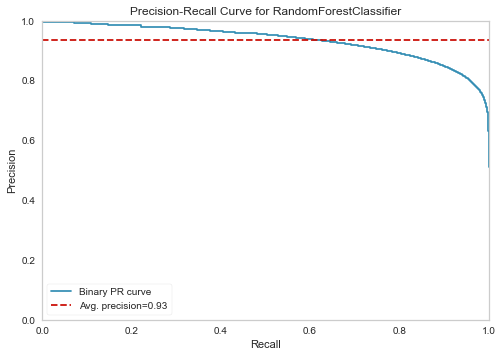

<AxesSubplot:title={'center':'Precision-Recall Curve for RandomForestClassifier'}, xlabel='Recall', ylabel='Precision'>

In [21]:
from yellowbrick.classifier import PrecisionRecallCurve
viz = PrecisionRecallCurve(RandomForestClassifier(n_estimators=100),
                           per_class=True,
                           cmap="Set1")

viz.fit(x_train, y_train)
viz.score(x_test, y_test)
viz.show()

#### Confusion Matrix

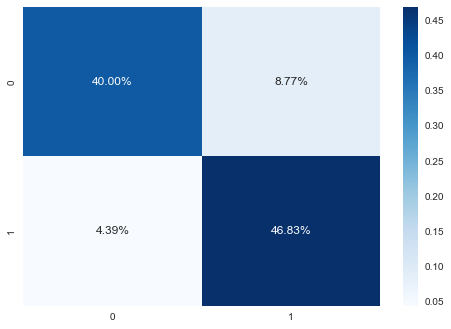

In [22]:
from sklearn.metrics import confusion_matrix
y_pred = forest.predict(x_test)
cf_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,
                 fmt='.2%', cmap='Blues')


### ISSUE :

Random Forest Model takes a huge time to load the saved model from the disk & then to be used in webApp hosted from regular PC/Laptop.
And eventually while loading the model/running the web App pc/laptop can get freezed for a long time.
To avoid this issue we can use the KNN Model Hypertune it to get best accuracy.
However the best accuracy acquired may/may not be equal or greater than the accuracy of Random Forest Model.
But for the sake of deploying the webApp on a regular PC/Laptop we can use the KNN model instead of Random Forest Model.

PS : Quite similar issue is faced when I tried to hypertune the Random Forest Model.

(Edit : While Hypertuning KNN Model exact same issue is faced (due to avg specs) when I tried to search best parameters while changing P, Leaf size etc it takes huge time. So, instead of varying those values I only varied the "n_neighbors" parameters & found the best n_neighbors for both the models. 

### Hyper-Tuning KNN Model For Air Temperature Prediction

In [14]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

In [15]:
n_neighbors = list(range(1,20))
#Convert to dictionary
hyperparameters = dict(n_neighbors=n_neighbors)
#Create new KNN object
knn_2 = KNeighborsClassifier()
#Use GridSearch
clf = GridSearchCV(knn_2, hyperparameters)
#Fit the model
best_model = clf.fit(x_train_scaled,y_train)

In [16]:
#Print The value of best Hyperparameters
print('Best n_neighbors:',best_model.best_estimator_.get_params()['n_neighbors'])

Best n_neighbors: 13


### Final KNN Model for Predicting Air Temperature

In [34]:
# KNN Model Creation
from sklearn.neighbors import KNeighborsClassifier
knn_temp = KNeighborsClassifier(n_neighbors=13)
# With Scaling
knn_temp.fit(x_train_scaled, y_train)

KNeighborsClassifier(n_neighbors=13)

In [38]:
test_score = knn_temp.score(x_test_scaled, y_test)
print(f"Test Score of KNN Model for Predicting Air Temperature : {round(test_score*100)}%")

Test Score of KNN Model for Predicting Air Temperature : 84.0%


#### Saving The Model

In [35]:
# Saving The Model
import pickle
# Saving The Model
temp_model = r'models/temp_model.sav'
pickle.dump(knn_temp, open(temp_model, 'wb'))

#### Precision-Recall Curve

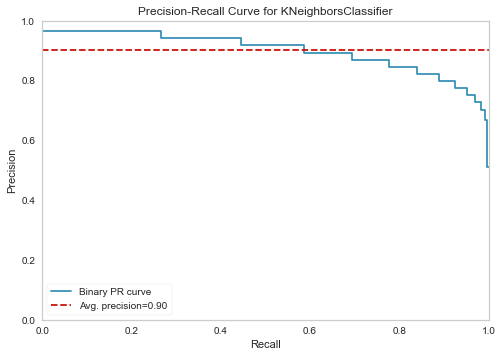

<AxesSubplot:title={'center':'Precision-Recall Curve for KNeighborsClassifier'}, xlabel='Recall', ylabel='Precision'>

In [36]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(KNeighborsClassifier(n_neighbors=13),
                           per_class=True,
                           cmap="Set1")
viz.fit(x_train_scaled, y_train)
viz.score(x_test_scaled, y_test)
viz.show()

#### Confusion Matrix

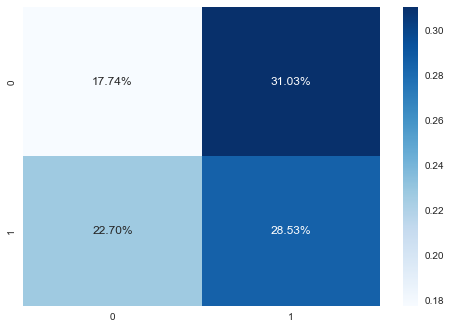

In [37]:
from sklearn.metrics import confusion_matrix
y_pred = knn_humid.predict(x_test_scaled)
cf_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,
                 fmt='.2%', cmap='Blues')

## Analysis & Data Preparation for Relative Humidity Prediction

In [11]:
avg_humid = df['relative_humidity'].mean()
max_humid = df['relative_humidity'].max()
min_humid = df['relative_humidity'].min()
print(f"The average Humidity is {round(avg_humid)}"
      f"\nThe maximum Humidity is {max_humid}"
      f"\nThe minimum Humidity is {min_humid}")

The average Humidity is 48
The maximum Humidity is 93.0
The minimum Humidity is 0.7


### Correlation between Features

In [48]:
## Finding Correlation between features
corr = df_humidity.corrwith(df_humidity['relative_humidity'])

In [49]:
print(f"Correlation :\n{corr}")

Correlation :
air_pressure         -0.375846
air_temp             -0.620059
avg_wind_direction    0.205829
avg_wind_speed        0.061139
max_wind_direction    0.241055
max_wind_speed        0.048773
min_wind_direction    0.129133
min_wind_speed        0.072227
rain_accumulation     0.000585
rain_duration         0.006934
relative_humidity     1.000000
dtype: float64


We can see there's no high correlation between the features and the target variable(Relative Humidity).

### For Classification we will be classifying Relative Humidity in two classes :
1. Relatively Dry
2. Relatively Humid

### Data Encoding

In [8]:
mean = df_humidity['relative_humidity'].mean()


def encoder(data):
    if data <= mean:
        return 0
    elif data > mean:
        return 1


df_humidity['relative_humidity'] = df_humidity['relative_humidity'].apply(encoder)
print(df_humidity['relative_humidity'].unique())

[0 1]


### Let's see the distribution of two classes w.r.t each features

As we've seen, there's a huge number of datapoints .So, to plot distribution I'm going to use 5000 datapoints only otherwise it'll take more computation power & time.

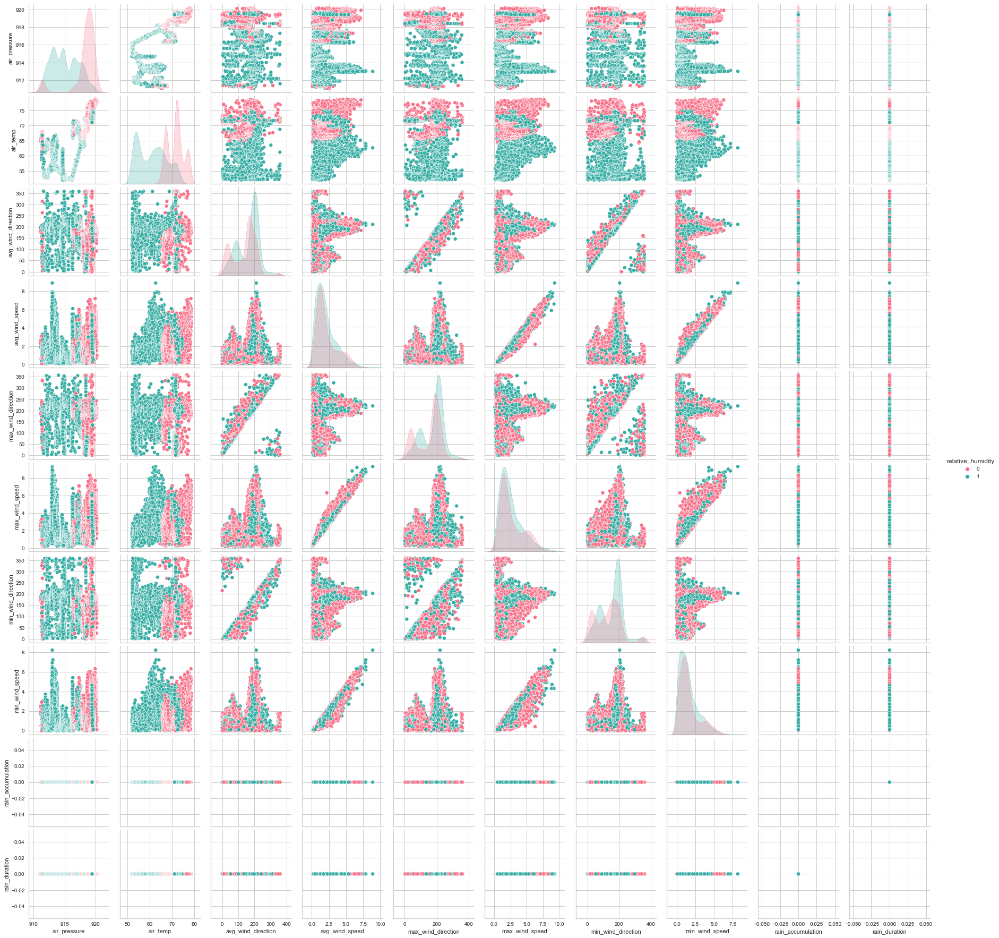

In [27]:
sns.pairplot(df_humidity.iloc[:5000, :], hue="relative_humidity", palette="husl")

We can see that the data is not classified in a well manner rather they're distributed unevenly & hence using logistic, kmeans is not an option.

### Data-Preparation :

In [96]:
req_features = ["air_pressure",
                "avg_wind_direction",
                "avg_wind_speed",
                "air_temp",
                "max_wind_direction",
                "max_wind_speed",
                "min_wind_direction",
                "min_wind_speed",
                "rain_accumulation",
                "rain_duration"
                ]

target_feature = ["relative_humidity"]

x = df_humidity[req_features]
y = df_humidity[target_feature]

### Splitting Data :

In [97]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.1, random_state=42)

In [15]:
## Scaling the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [16]:
scaler_file = {
    'mean_' : scaler.mean_,
    'scale_' : scaler.scale_,
    'var_' : scaler.var_,
    'n_samples_seen_' : scaler.n_samples_seen_,
    'n_features_in_' : scaler.n_features_in_,
    'feature_names_in_' : scaler.feature_names_in_
}

In [17]:
scaler_file

{'mean_': array([9.16829300e+02, 1.62029069e+02, 2.77375705e+00, 6.18577438e+01,
        1.63463955e+02, 3.39882273e+00, 1.66862985e+02, 2.13290007e+00,
        1.24790287e-03, 5.07305306e-01]),
 'scale_': array([ 3.04994532, 95.20905515,  2.06063396, 11.83327558, 92.38005076,
         2.42261699, 97.45225696,  1.7453824 ,  0.7676629 , 76.96323774]),
 'var_': array([9.30216646e+00, 9.06476418e+03, 4.24621233e+00, 1.40026411e+02,
        8.53407378e+03, 5.86907307e+00, 9.49694239e+03, 3.04635973e+00,
        5.89306321e-01, 5.92333996e+03]),
 'n_samples_seen_': 1428140,
 'n_features_in_': 10,
 'feature_names_in_': array(['air_pressure', 'avg_wind_direction', 'avg_wind_speed', 'air_temp',
        'max_wind_direction', 'max_wind_speed', 'min_wind_direction',
        'min_wind_speed', 'rain_accumulation', 'rain_duration'],
       dtype=object)}

### Fitting Models :

1. K-Nearest Neighbors
2. Decision Tree
3. Random Forest

#### KNN Model

In [15]:
# KNN Model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)

##### Without Scaling

In [16]:
# Without Scaling
knn.fit(x_train, y_train)
train_score = knn.score(x_train, y_train)
test_score = knn.score(x_test, y_test)
print(f"Train Score: {train_score}"
      f"\nTest Score: {test_score}")

Train Score: 0.867363843880852
Test Score: 0.8111076800917553


##### With Scaling

In [17]:
# With Scaling
knn.fit(x_train_scaled, y_train)
train_score = knn.score(x_train_scaled, y_train)
test_score = knn.score(x_test_scaled, y_test)
print(f"The training score is {train_score}"
      f"\nThe test score is {test_score}")

The training score is 0.8992633775400171
The test score is 0.8540297322334466


#### Using Decision Tree Model

In [18]:
# Decision Tree Model
from sklearn import tree
tree = tree.DecisionTreeClassifier()

##### Without Scaling

In [19]:
# Without Scaling
tree.fit(x_train, y_train)
test_score = tree.score(x_test, y_test)
train_score = tree.score(x_train, y_train)
print(f"Train Score : {train_score}"
      f"\nTest Score : {test_score}")

Train Score : 1.0
Test Score : 0.8469716352728396


##### With Scaling

In [20]:
# With Scaling
tree.fit(x_train_scaled, y_train)
train_score = tree.score(x_train_scaled, y_train)
test_score = tree.score(x_test_scaled, y_test)
print(f"The training score is {train_score}"
      f"\nThe test score is {test_score}")


The training score is 1.0
The test score is 0.8470094465065571


#### Using Random Forest Classifier

In [21]:
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier(n_estimators=100)

##### Without Scaling

In [22]:
# Without Scaling
forest.fit(x_train, y_train)
test_score = forest.score(x_test, y_test)
train_score = forest.score(x_train, y_train)
print(f"Train Score : {train_score}"
      f"\nTest Score : {test_score}")

Train Score : 0.9999943983082891
Test Score : 0.8766534537411065


##### Without Scaling

In [23]:
# With Scaling
forest.fit(x_train_scaled, y_train)
train_score = forest.score(x_train_scaled, y_train)
test_score = forest.score(x_test_scaled, y_test)
print(f"The training score is {train_score}"
      f"\nThe test score is {test_score}")

The training score is 0.9999943983082891
The test score is 0.8772395278637283


In [36]:
forest.score(x_test_scaled, y_test)


0.8772395278637283

### Final Model Creation for Realtive Humidity Prediction

In [117]:
from sklearn.ensemble import RandomForestClassifier
humid_pred = RandomForestClassifier(n_estimators=100)
# With Scaling
humid_pred.fit(x_train_scaled, y_train)

RandomForestClassifier()

In [120]:
train_score = humid_pred.score(x_train_scaled, y_train)
test_score = humid_pred.score(x_test_scaled, y_test)
print(f"The training score is {train_score}"
      f"\nThe test score is {test_score}")

The training score is 0.9999957987312168
The test score is 0.8774726971383198


In [121]:
import pickle
# Saving The Model
humid_model = r'outputs/humid_model.sav'
pickle.dump(humid_pred, open(humid_model, 'wb'))

#### Precison-Recall Curve

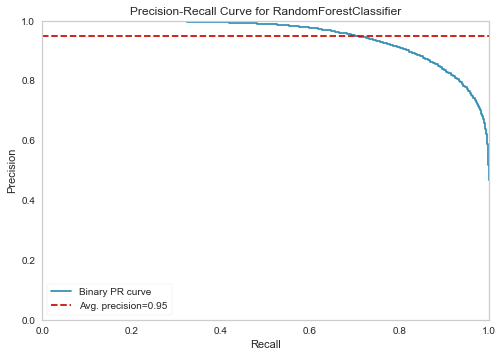

<AxesSubplot:title={'center':'Precision-Recall Curve for RandomForestClassifier'}, xlabel='Recall', ylabel='Precision'>

In [119]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(RandomForestClassifier(n_estimators=100),
                           per_class=True,
                           cmap="Set1")
viz.fit(x_train_scaled, y_train)
viz.score(x_test_scaled, y_test)
viz.show()

#### Confusion Matrix

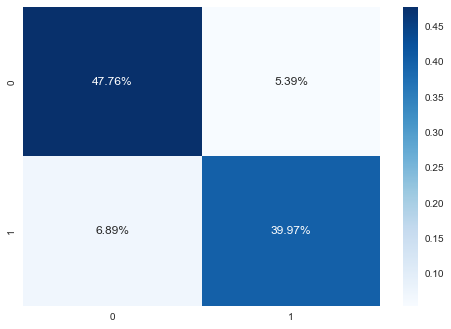

In [122]:
from sklearn.metrics import confusion_matrix
y_pred = forest.predict(x_test_scaled)
cf_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,
                 fmt='.2%', cmap='Blues')

### Hyper-Tuning the KNN Model

In [ ]:
from sklearn.model_selection import GridSearchCV

In [21]:
n_neighbors = list(range(1, 20))
#Convert to dictionary
hyperparameters = dict(n_neighbors=n_neighbors)
#Create new KNN object
knn_2 = KNeighborsClassifier()
#Use GridSearch
clf = GridSearchCV(knn_2, hyperparameters)
#Fit the model
best_model = clf.fit(x_train_scaled, y_train)
#Print The value of best Hyperparameters
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])

Best n_neighbors: 11


### Final KNN Model For Relative Humidity Prediction

In [22]:
# KNN Model Creation
from sklearn.neighbors import KNeighborsClassifier
knn_humid = KNeighborsClassifier(n_neighbors=11)
# With Scaling
knn_humid.fit(x_train_scaled, y_train)

KNeighborsClassifier(n_neighbors=11)

In [27]:
test_score = knn_humid.score(x_test_scaled, y_test)
print(f"Test Score of KNN Model for Predicting Relative Humidity : {round(test_score*100)}%")

Test Score of KNN Model for Predicting Relative Humidity : 86.0%


#### Saving The Model

In [24]:
# Saving The Model
import pickle
# Saving The Model
humid_model = r'models/humid_model.sav'
pickle.dump(knn_humid, open(humid_model, 'wb'))

#### Precision-Recall Curve

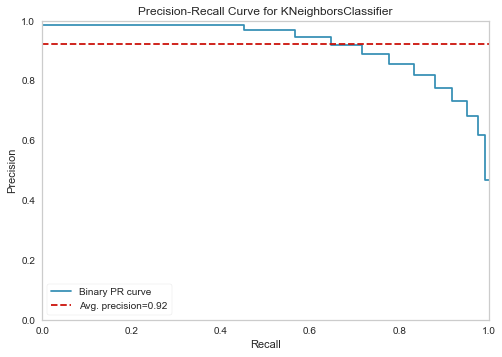

<AxesSubplot:title={'center':'Precision-Recall Curve for KNeighborsClassifier'}, xlabel='Recall', ylabel='Precision'>

In [25]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(KNeighborsClassifier(n_neighbors=11),
                           per_class=True,
                           cmap="Set1")
viz.fit(x_train_scaled, y_train)
viz.score(x_test_scaled, y_test)
viz.show()

#### Confusion Matrix

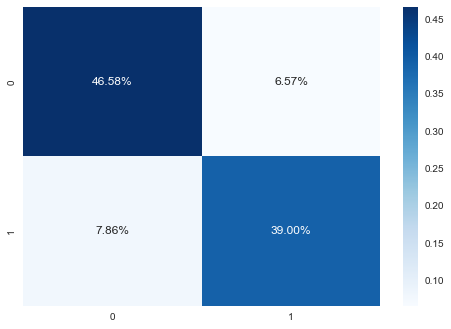

In [26]:
from sklearn.metrics import confusion_matrix
y_pred = knn_humid.predict(x_test_scaled)
cf_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,
                 fmt='.2%', cmap='Blues')